# Advanced Lane Finding

# Import Packages

In [1]:
import os
import cv2
import numpy as np
import pickle
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# Camera Calibration

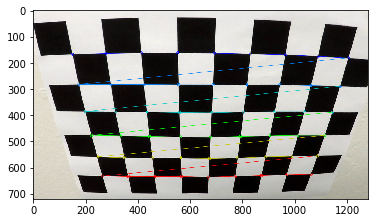

In [2]:
# prepare object points
nx = 9 
ny = 6
objp = np.zeros((nx*ny,3),np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# arrays to store object points and image points from all the images
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d poins in image plane

images = glob.glob("./camera_cal/calibration*.jpg")

# Step through the list and search for chessboard corners
for fname in images:
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    # If found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        # Draw and display corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)

#  Undistort camera image

In [ ]:
def cal_undistort(img,read,display): 
    if read == True:
        img = mpimg.imread(img)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1:], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    if display == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image',fontsize = 50)
        ax2.imshow(undist)
        ax2.set_title('Undistorted Image',fontsize = 50)
    return undist
img = mpimg.imread('camera_cal/calibration2.jpg')
output_image01 = cal_undistort(img,False,True)
mpimg.imsave("../output_images/", output_image01)

# Pipeline Constraction


* Undistort the original images
* Find the binary selection of the images by combined color and gradient threshold to the undistorted images
* Apply perspective transformation to the binary images
* Measure the curvature and fit a polynomial for the lane lines
* Plot out the found lane lines on the image/vedio


##   Undistort the test images
 

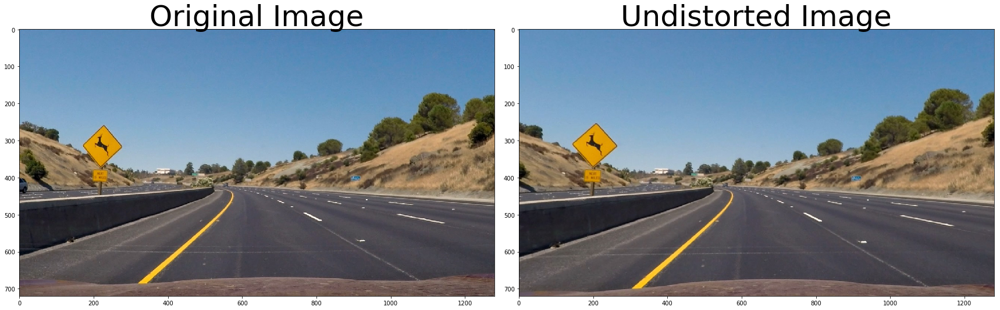

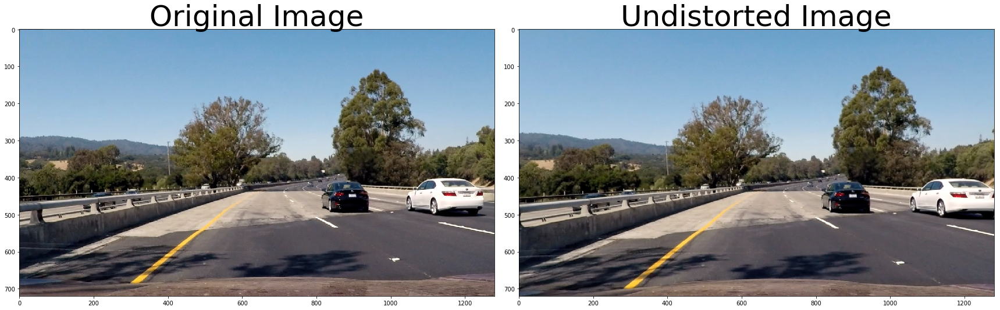

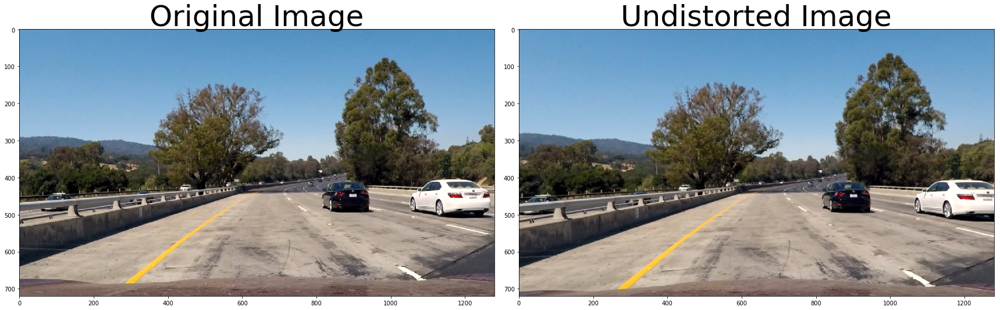

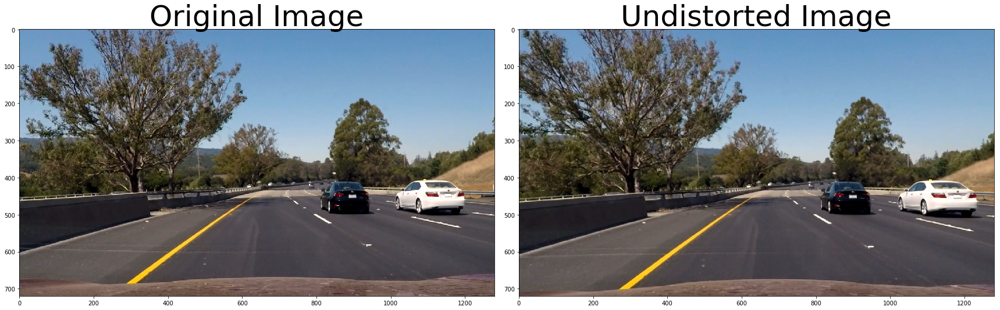

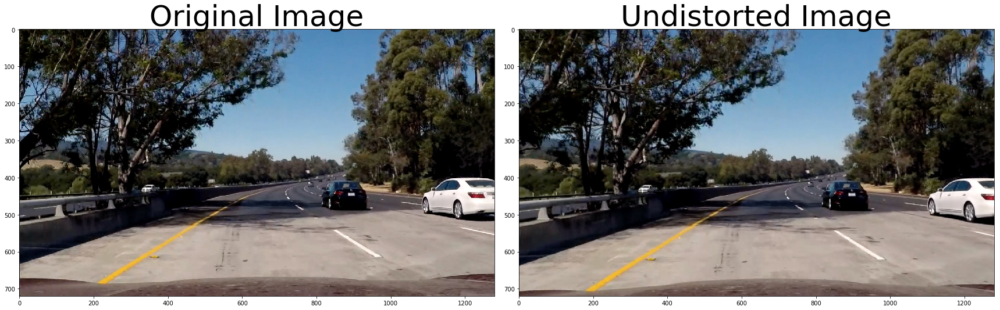

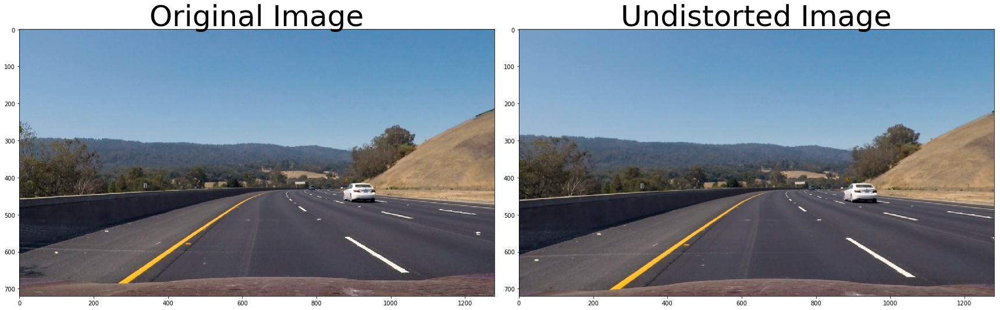

In [4]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    undist = cal_undistort(image,True,True)

## Create binary images

In [5]:
def combined_binary(img,read,display):
    if read == True:
        img = mpimg.imread(img)        
    
    
    img = np.copy(img)    

    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    # separate the R channel
    r_channel = img[:,:,0]
    
    # Sobel x 
    sobelx = cv2.Sobel(r_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    if display == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        f.tight_layout()
        ax1.imshow(cal_undistort(img,False,False))
        ax1.set_title('Undistorted Image',fontsize = 50)
        ax2.imshow(combined_binary, cmap='gray')
        ax2.set_title('Selected Binary', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return combined_binary

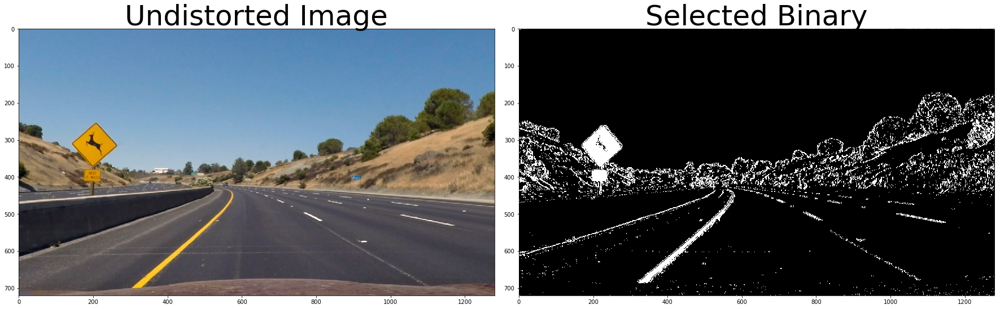

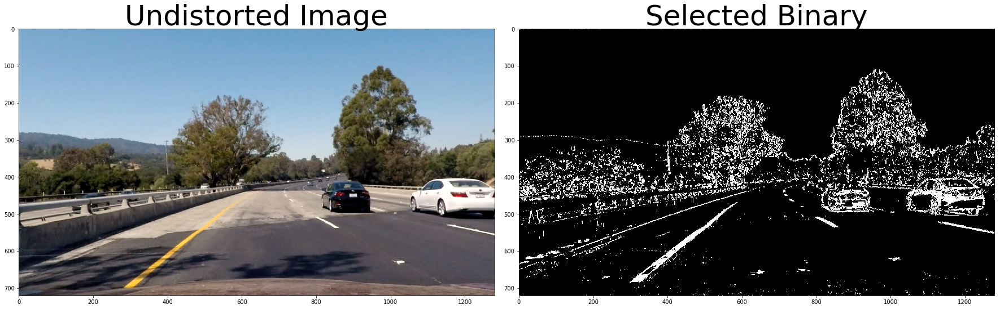

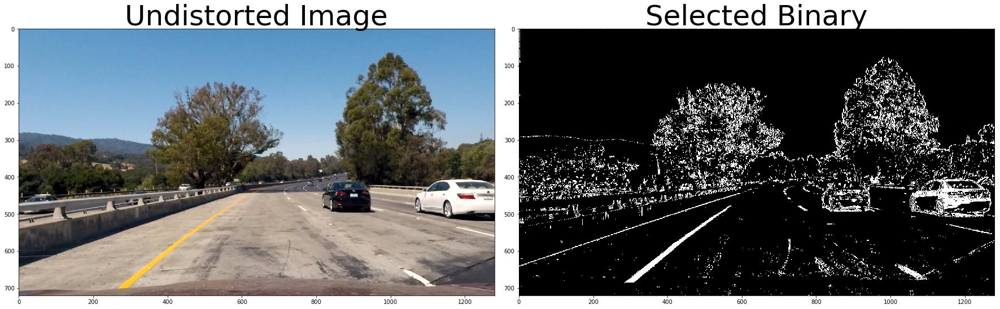

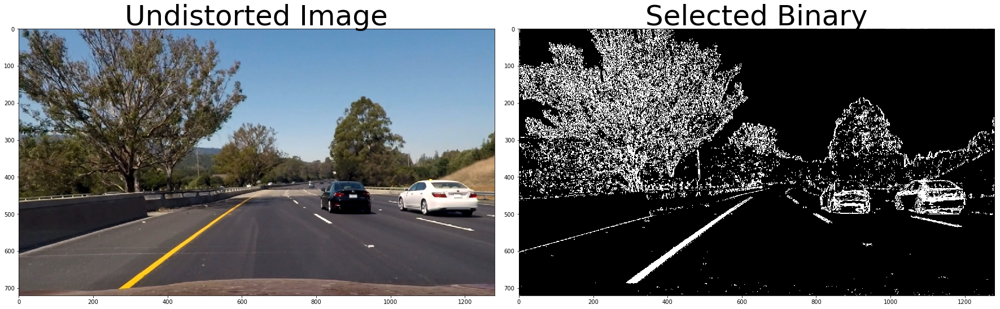

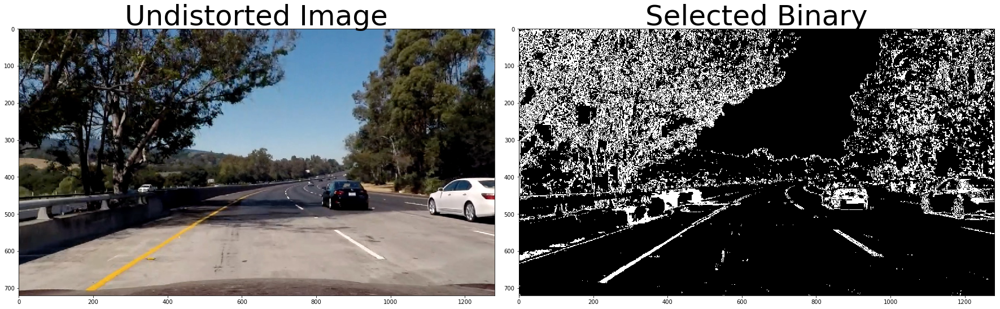

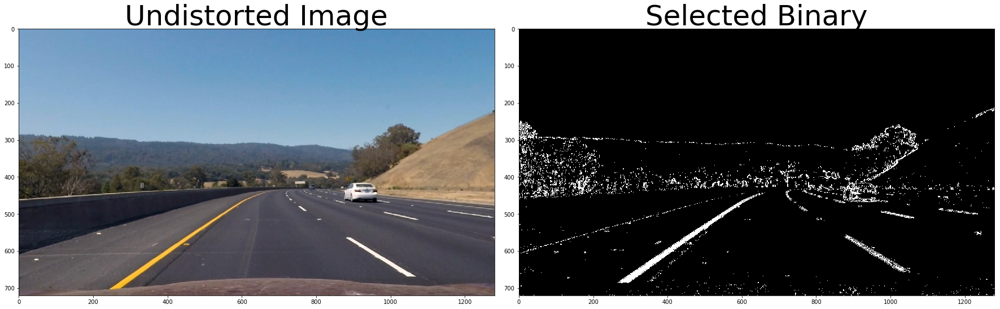

In [6]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    binary = combined_binary(image,True,True)
    mpimg.imsave("../output_images/" + i , binary)

# Perspective Transformation

In [7]:
def corners_unwarp(img,read,display,inv):
    if read == True:
        img = mpimg.imread(img)
    img_size = (img.shape[1],img.shape[0])
    src = np.float32([[713, 460],
            [1095, 695], 
            [195,695], 
            [570,460]])
    dst = np.float32([[1080, 0],
            [1080, 720], 
            [200, 720], 
            [200, 0]])
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    binary_warped = combined_binary(warped,False,False)
    if display == True:
        f, (ax1,ax2) = plt.subplots(1,2,figsize = (20,10))
        ax1.set_title('Original')
        ax1.imshow(img)
        ax2.set_title('Wraped')
        ax2.imshow(warped,cmap='gray')
    if inv == True:
        return M_inv,binary_warped, warped
    else:
        return binary_warped, warped  

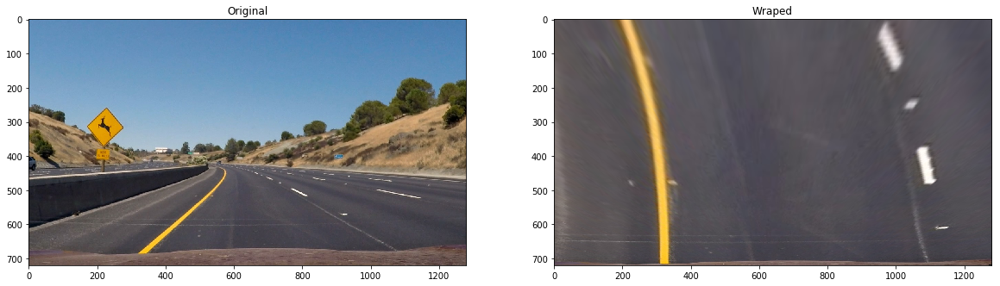

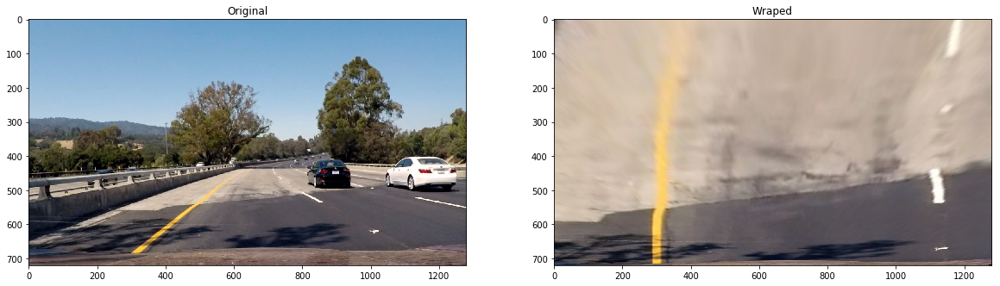

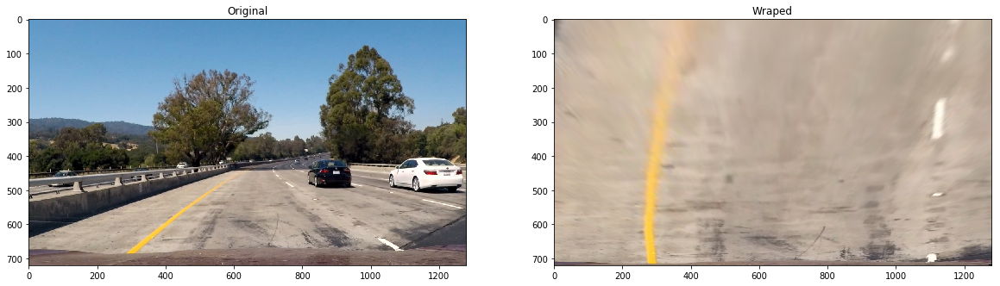

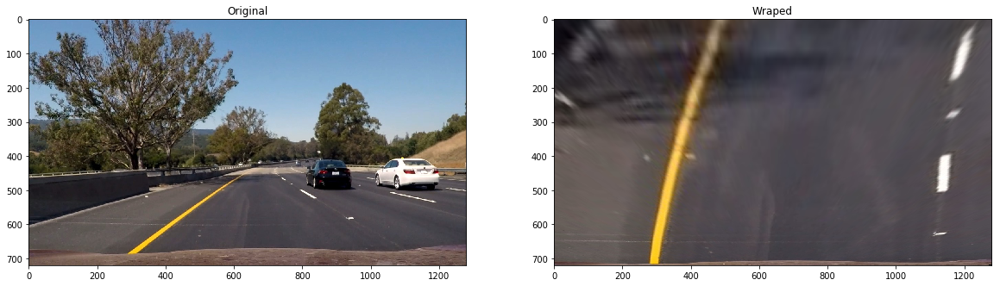

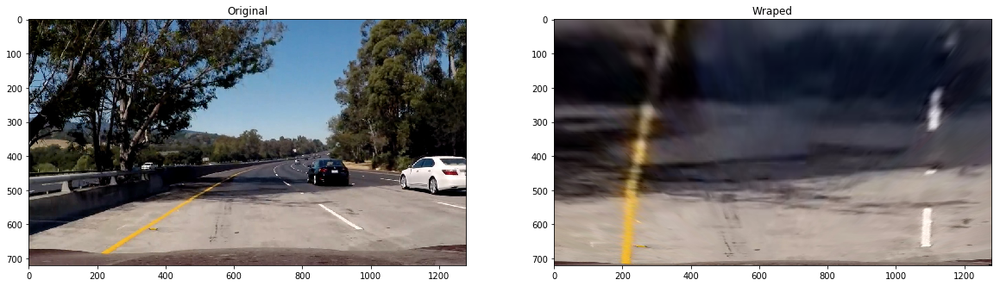

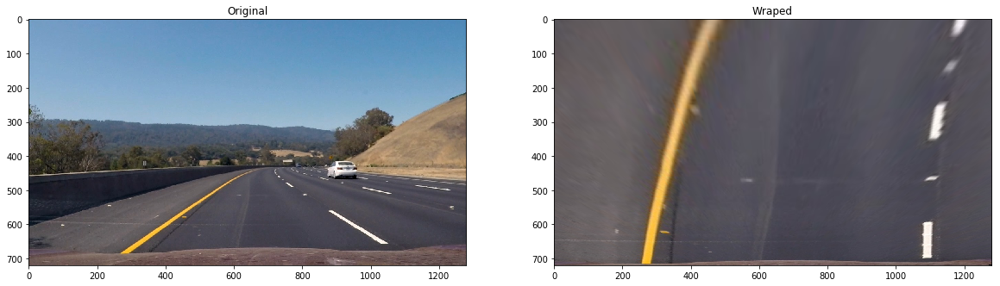

In [8]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    binary,warped = corners_unwarp(image,True,True,False)

# Detect lane pixels and fit to find the lane boundary.

In [9]:
def find_the_lane(img):
    M_inv,binary_warped,warped = corners_unwarp(img,False,False,True)
    binary_all = combined_binary(img,False,False)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        # Find the four below boundaries of the window 
        win_xleft_low = leftx_current - margin  
        win_xleft_high = leftx_current + margin 
        win_xright_low = rightx_current - margin 
        win_xright_high = rightx_current + margin 
        
        
        ### Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        #(win_xleft_high,win_y_high),(0,255,0), 2) 
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),
        #(win_xright_high,win_y_high),(0,255,0), 2)
        
        # Identify the nonzero pixels in x and y within the window 
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        center_fitx = (left_fitx+right_fitx)/2
        center_fit = np.polyfit(ploty, center_fitx, 2)
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        y_eval = np.max(ploty)
        left_fit_cr = np.polyfit(lefty*ym_per_pix,leftx*xm_per_pix,2)
        right_fit_cr = np.polyfit(righty*ym_per_pix,rightx*xm_per_pix,2)
        center_fit_cr = np.polyfit(ploty*ym_per_pix, center_fitx*xm_per_pix, 2)
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        curverad = ((1 + (2*center_fit_cr[0]*y_eval*ym_per_pix + center_fit_cr[1])**2)**1.5) / np.absolute(2*center_fit_cr[0])
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
        
    # Figure out distance from center (assume 1280 x 720)
    center_fit_basis = center_fit[0]*y_eval**2 + center_fit[1]*y_eval + center_fit[2]
    dist_from_center = (center_fit_basis - 1280/2) * xm_per_pix
        
    # Create an image to draw the lines on    
    warp_zero = np.zeros_like(binary_all).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (binary_all.shape[1], binary_all.shape[0]))
    
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.5, 0)
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(warped)
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(0, 720)
    ax1.plot(left_fitx, ploty, color='green', linewidth=3)
    ax1.plot(right_fitx, ploty, color='green', linewidth=3)
    ax1.set_title('Top view of the Lane line', fontsize=16)
    ax1.invert_yaxis() # to visualize as we do the images
    ax2.imshow(result)
    ax2.set_title('Normal View of the lane line', fontsize=16)
    ax2.text(100,100, 'Radius of lane curvature is : % .1f m' %curverad
            , color='white', fontsize=10)
    ax2.text(100,200, 'Distance from center : % .1f m ' %dist_from_center
            , color='white', fontsize=10)
    return result

# Test images

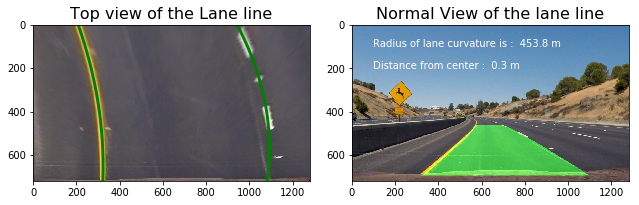

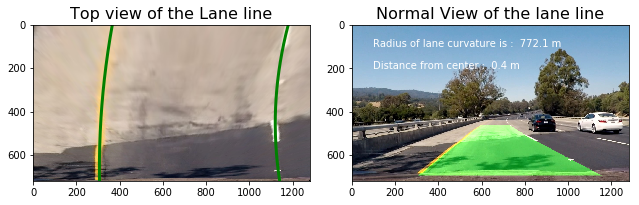

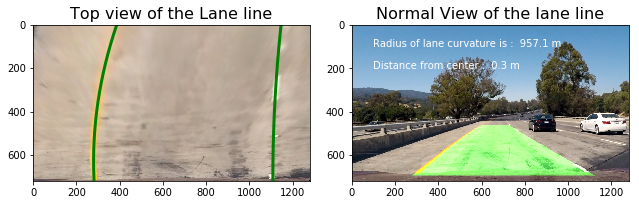

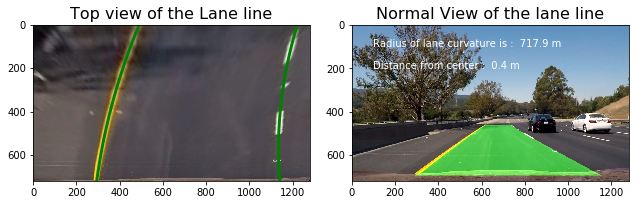

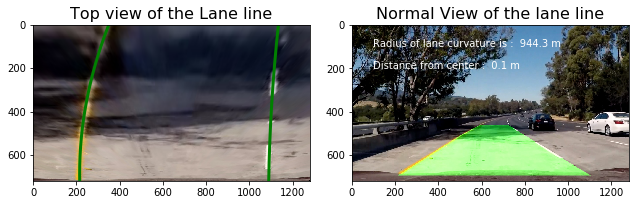

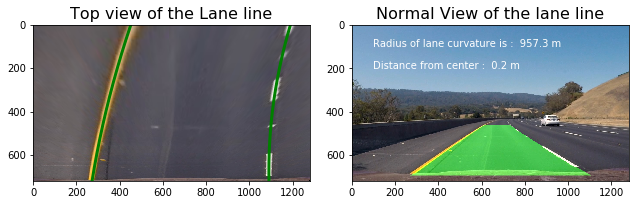

In [10]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    img = mpimg.imread(image)
    find_the_lane(img)

# Test Videos

In [11]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [12]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self,name):
        self.name = name
        # norm difference of coefficient
        self.codiff = 0
        # was the line detected in the last iteration?
        self.detected = False  
        # polynomial values of the last n fits of the line
        self.recent_fitted = []   
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = []
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None 
        # count the number of frames
        self.count = 0
        
    def found(self,x,y):
        norm = 100
        if self.detected == True:
            fit = self.best_fit
            margin = 100
            lane_indx = ((x > (fit[0]*(y**2)+fit[1]*y+fit[2]-margin)) & (x < (fit[0]*(y**2)+fit[1]*y+fit[2]+margin)))
            x_new = x[lane_indx]
            y_new = y[lane_indx]
            if np.sum(x_new) != 0:
                self.detected = True
                self.count += 1  
                self.allx = x_new
                self.ally = y_new
                self.current_fit = np.polyfit(y_new,x_new,2) 
                # if the number of the frame is smaller than n = 10, we don't delete the previous one
                if self.count == 1:
                    self.best_fit = [self.current_fit]
                if self.count <= 10 and self.count != 1:
                    diff = np.subtract(self.best_fit,self.current_fit)
                    self.codiff = np.sqrt(diff[0]**2+diff[1]**2+diff[2]**2)
                    if self.codiff <= norm:
                        self.recent_fitted.append(self.current_fit)
                        self.best_fit = np.mean(self.recent_fitted, axis=0)
                else:                    
                    diff = np.subtract(self.best_fit,self.current_fit)
                    self.codiff = np.sqrt(diff[0]**2+diff[1]**2+diff[2]**2)
                    if self.codiff <= norm:
                        self.recent_fitted = self.recent_fitted[1:] + [self.current_fit]
                        self.best_fit = np.mean(self.recent_fitted, axis=0)
            if np.sum(x_new) == 0:
                self.detected = False 

            
    def blind(self,x,y,img):
        norm = 100
        if self.detected == False:
            histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
            midpoint = np.int(histogram.shape[0]//2)
            margin = 25
            nwindows = 9
            minipix = 50
            window_height = np.int(img.shape[0]//nwindows)
            if self.name == 'left':
                base = np.argmax(histogram[:midpoint])               
            if self.name == 'right':
                base = np.argmax(histogram[midpoint:]) + midpoint
            x_current = base
            lane_inds = []
            for window in range(nwindows):
                win_y_low = img.shape[0] - (window+1)*window_height
                win_y_high = img.shape[0] - window*window_height
                win_x_low = x_current -margin
                win_x_high = x_current + margin
                good_inds = ((y >= win_y_low) & (y < win_y_high) & (x >= win_x_low) & (x < win_x_high)).nonzero()[0]
                lane_inds.append(good_inds)
                if len(lane_inds) >minipix:
                    x_current =  np.int(np.mean(x[good_inds]))
            lane_inds = np.concatenate(lane_inds)
            x_new = x[lane_inds]
            y_new = y[lane_inds]
            if np.sum(x_new) != 0:
                self.count += 1
                self.detected = True
                self.allx = x_new
                self.ally = y_new
                self.current_fit = np.polyfit(y_new,x_new,2)
                
                # if the number of the frame is smaller than n = 10, we don't delete the previous frame
                if self.count == 1:
                    self.best_fit = self.current_fit
                if self.count <= 10 and self.count != 1:
                    #print('count',self.count)
                    diff = np.subtract(self.best_fit,self.current_fit)
                    self.codiff = np.sqrt(diff[0]**2+diff[1]**2+diff[2]**2)
                    if self.codiff <= norm:
                        self.recent_fitted.append(self.current_fit)
                        self.best_fit = np.mean(self.recent_fitted, axis=0)
                        
                if self.count > 10:
                    diff = np.subtract(self.best_fit,self.current_fit)
                    self.codiff = np.sqrt(diff[0]**2+diff[1]**2+diff[2]**2)
                    if self.codiff <= norm:
                        self.recent_fitted = self.recent_fitted[1:] + [self.current_fit]
                        self.best_fit = np.mean(self.recent_fitted, axis=0)
            if np.sum(x_new) == 0:
                self.detected = False 

        
    def curvature(self):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        x_value = self.allx
        y_value = self.ally
        fit = np.polyfit(y_value*ym_per_pix, x_value*xm_per_pix, 2)
        self.radius_of_curvature = ((1 + (2*fit[0]*np.max(y_value) + fit[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return self.radius_of_curvature

In [13]:
Left = Line('left')
Right = Line('right')
def video(img):

    
    ## Find the binary selection of the frame
    M_inv,binary_warped,warped = corners_unwarp(img,False,False,True)
    binary_all = combined_binary(img,False,False)
    nonzero = binary_warped.nonzero()
    y = np.array(nonzero[0])
    x = np.array(nonzero[1])
    
    ploty = np.linspace(0, 719, 720)

    
    # Update the Left and Right object
    if Left.detected == True:
        Left.found(x,y)         
    if Right.detected == True:
        Right.found(x,y)      
    if Left.detected == False:
        Left.blind(x,y,binary_warped)      
    if Right.detected == False:
        Right.blind(x,y,binary_warped)

    
    left_fit = Left.best_fit
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit = Right.best_fit
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
    # Find the position of the vehicle
    start_ind = binary_warped.shape[0]-1
    left_start = left_fitx[start_ind]
    right_start = right_fitx[start_ind]
    center_pos = (left_start+right_start)/2
    offset = 640 - center_pos
        
    # Create an image to draw the lines on    
    warp_zero = np.zeros_like(binary_all).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (binary_all.shape[1], binary_all.shape[0]))
    
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.5, 0)
    return result

In [14]:
white_output = 'project_out.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(video)
%time white_clip.write_videofile(white_output,audio = False)

[MoviePy] >>>> Building video project_out.mp4
[MoviePy] Writing video project_out.mp4


100%|█████████▉| 1260/1261 [03:56<00:00,  5.40it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_out.mp4 

CPU times: user 1min 54s, sys: 2.73 s, total: 1min 56s
Wall time: 3min 59s


In [15]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))